In [1]:
print("Start")

Start


In [2]:
import copy
import numpy as np 

import torch
import torch.optim as optim 
import torch.nn as nn 
import torch.nn.functional as F 

import torchvision
from torch.utils.data import DataLoader, Dataset, random_split, TensorDataset,Subset
from torchvision import transforms
from torchvision.transforms import Compose, Normalize, Pad
from torchvision import models

import cv2
from PIL import Image
import pandas as pd

import matplotlib.pyplot as plt
from torchvision.ops import nms

from PIL import Image, ImageDraw, ImageFont

In [3]:
import warnings

warnings.filterwarnings(
    "ignore",
    message="Applying `local_binary_pattern` to floating-point images"
)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
%pip install selectivesearch

Note: you may need to restart the kernel to use updated packages.


In [6]:
import selectivesearch

In [7]:
Image_root = "/kaggle/input/datasets/sixhky/open-images-bus-trucks/images/images"

In [8]:
df_raw = pd.read_csv("/kaggle/input/datasets/sixhky/open-images-bus-trucks/df.csv")

In [9]:
df_raw.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
0,0000599864fd15b3,xclick,Bus,1,0.343750,0.908750,0.156162,0.650047,1,0,...,0,0,0.421875,0.343750,0.795000,0.908750,0.156162,0.512700,0.650047,0.457197
1,00006bdb1eb5cd74,xclick,Truck,1,0.276667,0.697500,0.141604,0.437343,1,0,...,0,0,0.299167,0.276667,0.697500,0.659167,0.141604,0.241855,0.352130,0.437343
2,00006bdb1eb5cd74,xclick,Truck,1,0.702500,0.999167,0.204261,0.409774,1,1,...,0,0,0.849167,0.702500,0.906667,0.999167,0.204261,0.398496,0.409774,0.295739
3,00010bf498b64bab,xclick,Bus,1,0.156250,0.371250,0.269188,0.705228,0,0,...,0,0,0.274375,0.371250,0.311875,0.156250,0.269188,0.493882,0.705228,0.521691
4,00013f14dd4e168f,xclick,Bus,1,0.287500,0.999375,0.194184,0.999062,0,1,...,0,0,0.920000,0.999375,0.648750,0.287500,0.194184,0.303940,0.999062,0.523452


In [10]:
class OpenImages(Dataset):
    def __init__(self,df,image_folder=Image_root):
        self.root = image_folder
        self.df = df
        self.unique_images = df["ImageID"].unique()
    def __len__(self):
        return len(self.unique_images)
    def __getitem__(self,ix):
        image_id = self.unique_images[ix]
        image_path = f"{self.root}/{image_id}.jpg"
        image = cv2.imread(image_path,1)[...,::-1]
        h,w, _ = image.shape
        df = self.df.copy()
        df = df[df["ImageID"] == image_id]
        boxes = df["XMin,YMin,XMax,YMax".split(",")].values
        boxes = (boxes*np.array([w,h,w,h])).astype(np.uint16).tolist()
        classes = df["LabelName"].values.tolist()
        return image, boxes, classes, image_path

In [11]:
ds = OpenImages(df=df_raw)

In [12]:
def get_candidates(img):
    img_lbl, regions = selectivesearch.selective_search(img,scale=200,min_size=100)
    img_area = np.prod(img.shape[:2])
    candidates = []
    for r in regions:
        if r["rect"] in candidates:
            continue
        if r["size"] < (0.05*img_area):
            continue
        if r["size"] > (1*img_area):
            continue
        x, y, w, h = r["rect"]
        candidates.append(list(r["rect"]))
    return candidates
def get_iou(boxA,boxB,epsilon=1e-5):
    x1 = max(boxA[0],boxB[0])
    y1 = max(boxA[1],boxB[1])
    x2 = min(boxA[2],boxB[2])
    y2 = min(boxA[3],boxB[3])
    width = (x2-x1)
    height = (y2-y1)
    if (width<0) or (height<0):
        return 0.0
    area_overlap = width * height
    area_a = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    area_b = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    area_combined = area_a + area_b - area_overlap
    iou = area_overlap/(area_combined+epsilon)
    return iou

In [13]:
FPATHS, GTBBS, CLSS, DELTAS, ROIS, IOUS = [],[],[],[],[],[]

In [14]:
N = 500
for ix, (im,bbs,labels,fpath) in enumerate(ds):
    if ix == N:
        break
    H,W, _ = im.shape
    candidates = get_candidates(im)
    all_candidates = []
    for i in range(0,len(candidates)):
        x,y,w,h  = candidates[i]
        all_candidates.append([x,y,x+w,y+h])
    all_candidates = np.array(all_candidates)
    ious, rois, clss, deltas = [], [], [], []
    
    for v in range(0,len(bbs)):
        temp = []
        for v1 in range(0,len(all_candidates)):
            temp.append(get_iou(all_candidates[v1],bbs[v]))
        ious.append(temp)
    ious = np.array(ious)
    ious = ious.T
    for ix,can in enumerate(all_candidates):
        cx,cy,cX,cY = can 
        corresponding_ious = ious[ix]
        max_iou_index = np.argmax(corresponding_ious)
        max_iou = corresponding_ious[max_iou_index]
        corresponding_max_iou_bbox = bbs[max_iou_index]
        _x,_y,_X,_Y = corresponding_max_iou_bbox
        if max_iou > 0.3:
            clss.append(labels[max_iou_index])
        else:
            clss.append("background")
        delta = np.array([
            _x-cx,
            _y-cy,
            _X-cX,
            _Y-cY
        ])/np.array([W,H,W,H])
        deltas.append(delta)
        can = can/np.array([W,H,W,H])
        rois.append(can)
    FPATHS.append(fpath)
    IOUS.append(ious)
    ROIS.append(rois)
    CLSS.append(clss)
    DELTAS.append(deltas)
        

In [15]:
normalize = transforms.Normalize(mean=[0.485,0.456,0.406],
                                std=[0.229,0.224,0.225])
def preprocess_image(img):
    img = torch.tensor(img).permute(2,0,1)
    img = normalize(img)
    return img.to(device).float()

In [16]:
class Fast_RCNN_Dataset(Dataset):
    def __init__(self,fpaths,rois,labels,deltas):
        self.fpaths = fpaths
        self.rois = rois
        self.labels = labels
        self.deltas = deltas 
    def __len__(self):
        return len(self.fpaths)
    def __getitem__(self,index):
        fpath = self.fpaths[index]
        img = cv2.imread(fpath,1)[...,::-1]
        H,W,_ = img.shape
        #scale = np.array([W,H,W,H])
        scale = np.array([224,224,224,224])
        rois = self.rois[index].copy()
        rois = (np.array(rois)*scale).astype(np.float32)
        labels = self.labels[index].copy()
        deltas = self.deltas[index].copy()
        for i in range(0,len(labels)):
            labels[i] = label2target[labels[i]]
        labels = torch.tensor(labels).long().to(device)
        deltas = np.array(deltas)
        deltas = torch.tensor(deltas).float().to(device)
        return rois, labels, deltas,fpath
    def collate_fn(self,batch):
        batch_rois, batch_labels, batch_deltas = [], [], []
        img_indices = []
        images = []
        for i in range(len(batch)):
            rois, labels, deltas,fpath  = batch[i]
            img = cv2.imread(fpath)
            img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            img_resized = cv2.resize(img,(224,224))
            img_resized = preprocess_image(img_resized/255.)
            img_resized = img_resized.unsqueeze(0)
            images.append(img_resized)
            for j in range(0,len(rois)):
                batch_rois.append(rois[j])
                img_indices.append(i)
            for j in range(0,labels.shape[0]):
                batch_labels.append(labels[j])
            for j in range(0,deltas.shape[0]):
                batch_deltas.append(deltas[j])
        img_indices = np.array(img_indices)
        img_indices = torch.tensor(img_indices,dtype=torch.float32).unsqueeze(1)
        batch_rois = np.array(batch_rois)
        batch_rois = torch.tensor(batch_rois,dtype=torch.float32)
        batch_rois = torch.cat([img_indices,batch_rois],dim=1)
        batch_labels = torch.stack(batch_labels)
        batch_deltas = torch.stack(batch_deltas)
        images = torch.cat(images,dim=0)
        return batch_rois,batch_labels,batch_deltas,images

In [17]:
fast_rcnn_ds = Fast_RCNN_Dataset(FPATHS, ROIS, CLSS, DELTAS)

In [18]:
def index_splitter(number,amount):
    indices = np.arange(number)
    amount = torch.tensor(amount)
    amount = amount * number
    amount = amount / 100
    amount = amount.int()
    amount[0] += (number-amount.sum())
    split1, split2,split3 = random_split(indices,amount)
    return split1.indices,split2.indices,split3.indices

In [19]:
train_indices,test_indices,val_indices = index_splitter(len(fast_rcnn_ds),[90,5,5])

In [20]:
train_set = Subset(fast_rcnn_ds,train_indices)
test_set = Subset(fast_rcnn_ds,test_indices)
val_set = Subset(fast_rcnn_ds,val_indices)

In [21]:
unique_labels = set()
for fire in CLSS:
    for ice in fire:
        unique_labels.add(ice)
print(unique_labels)

{'Bus', 'background', 'Truck'}


In [22]:
label2target = {"Bus":1,"background":0,"Truck":2}
target2label = {1:"Bus",0:"background",2:"Truck"}

In [23]:
train_loader = DataLoader(train_set,batch_size=2,collate_fn=fast_rcnn_ds.collate_fn)
#test_loader = DataLoader(test_set,batch_size=2,collate_fn=fast_rcnn_ds.collate_fn)
val_loader = DataLoader(val_set,batch_size=2,collate_fn=fast_rcnn_ds.collate_fn)

In [24]:
for x1,x2,x3,x4 in train_loader:
    print(x1.shape)
    print(type(x1[0]))
    print(x2.shape)
    print(type(x2[0]))
    print(x3.shape)
    print(type(x3[0]))
    print(x4.shape)
    break


torch.Size([81, 5])
<class 'torch.Tensor'>
torch.Size([81])
<class 'torch.Tensor'>
torch.Size([81, 4])
<class 'torch.Tensor'>
torch.Size([2, 3, 224, 224])


In [25]:
vgg_backbone = models.vgg16(weights=models.VGG16_Weights.DEFAULT)
backbone = vgg_backbone.features.to(device)

In [26]:
dummy_picture = torch.randn(1,3,224,224).to(device)
dummy_roi = torch.randn(1,5).to(device)

In [27]:
q1 = backbone(dummy_picture)

In [28]:
roi_features = None
for x1,x2,x3,x4 in train_loader:
    x1 = x1.to(device)
    roi_features = torchvision.ops.roi_pool(
            q1,
            x1,
            output_size=(7, 7),
            spatial_scale=1/16
            )

In [29]:
print(roi_features.shape)

torch.Size([94, 512, 7, 7])


In [30]:
print(roi_features.flatten(1).shape)

torch.Size([94, 25088])


In [31]:
feat_size = roi_features.flatten(1).shape[1]

In [32]:
class Fast_RCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = backbone
        self.cls_score = nn.Linear(feat_size,3)
        self.get_delta = nn.Sequential(
            nn.Linear(feat_size,64),#256
            nn.Dropout(0.44),
            nn.ReLU(),
            nn.Linear(64,4),
            nn.Tanh()
        )
    def forward(self,images,rois):
        feature_map = self.backbone(images)
        roi_features = torchvision.ops.roi_pool(
            feature_map,
            rois,
            output_size=(7, 7),
            spatial_scale=1/32
        )
        features = roi_features.flatten(1)
        cls_score = self.cls_score(features)
        delta = self.get_delta(features)
        return cls_score,delta

In [33]:
def loss_func(predicted_cls_logit,cls,predicted_deltas,deltas):
    classification_loss = nn.CrossEntropyLoss()(predicted_cls_logit,cls)
    indices = []
    for i in range(0,len(cls)):
        if cls[i]!=0:
            indices.append(i)
    predicted_deltas = predicted_deltas[indices]
    deltas = deltas[indices]
    if len(indices)!=0:
        regression_loss = nn.L1Loss()(predicted_deltas,deltas)
    else:
        regression_loss = predicted_deltas.sum() * 0.0

    total_loss =  classification_loss + 13.0 * regression_loss
    return total_loss, classification_loss.detach(), regression_loss.detach()

In [34]:
class DeepLearner:
    def __init__(self,model,loss_fn,optimizer):
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.loss_fn = loss_fn
        self.optimizer = optimizer
        self.best_val_loss = float("inf")
        self.best_model_weights = None
        self.best_optimizer_state = None
        self.last_model_weights = None
        self.last_optimizer_state = None
        self.train_losses = []
        self.val_losses = []
        self.epoch = 0 
        self.train_loader = None
        self.val_loader = None
        self.test_loader = None
    def set_loaders(self,train_loader=None,val_loader=None,test_loader=None):
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.test_loader = test_loader
    def train_each_batch(self):
        train_loss = 0.0
        self.model.train()
        x1,x2,x3,x4
        for indexed_rois,labels,deltas,images in self.train_loader:
            indexed_rois = indexed_rois.to(self.device)
            labels = labels.to(device)
            deltas = deltas.to(device)
            images = images.to(device)
            self.optimizer.zero_grad()
            cls_logit, predicted_bbox = self.model(images,indexed_rois)
            total_loss, cls_loss, regr_loss = self.loss_fn(cls_logit,labels,predicted_bbox,deltas)
            train_loss += total_loss.item()
            total_loss.backward()
            self.optimizer.step()
        train_loss = train_loss/len(self.train_loader)
        return train_loss
    def evaluate_each_batch(self,val=True):
        if val:
            loader = self.val_loader
        else:
            loader = self.test_loader
        loss = 0.0
        self.model.eval()
        for indexed_rois,labels,deltas,images in loader:
            indexed_rois = indexed_rois.to(self.device)
            labels = labels.to(device)
            deltas = deltas.to(device)
            images = images.to(device)
            cls_logit, predicted_bbox = self.model(images,indexed_rois)
            total_loss, cls_loss, regr_loss = self.loss_fn(cls_logit,labels,predicted_bbox,deltas)
            loss += total_loss.item()
        loss = loss/len(loader)
        return loss
    def pick_the_best_model(self):
        self.last_model_weights = copy.deepcopy(self.model.state_dict())
        self.model.load_state_dict(self.best_model_weights)
    def plot(self):
        epochs = range(1, len(self.train_losses) + 1)

        plt.figure(figsize=(8, 5))
        plt.plot(epochs, self.train_losses, marker="o", label="Training Loss")
        plt.plot(epochs, self.val_losses, marker="o", label="Validation Loss")


        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("Training and Validation Loss")
        plt.xticks(epochs)
        plt.legend()
        plt.grid(True)

        plt.show()
    def train(self,n_epoch):
        if self.epoch != 0:
            self.model.load_state_dict(self.last_model_weights)
            self.optimizer.load_state_dict(self.last_optimizer_state)
        initial_epoch = self.epoch
        while self.epoch + 1 <= initial_epoch + n_epoch:
            self.epoch += 1 
            train_loss = self.train_each_batch()
            self.train_losses.append(train_loss)
            val_loss = self.evaluate_each_batch()
            self.val_losses.append(val_loss)
            print("Epoch:",self.epoch)
            print("Training Loss:",train_loss)
            print("Validation Loss:",val_loss)
            if val_loss < self.best_val_loss:
                self.best_val_loss = val_loss 
                self.best_model_weights = copy.deepcopy(self.model.state_dict())
                self.best_optimizer_state = copy.deepcopy(self.optimizer.state_dict())
                print("✅Best Model saved from epoch",self.epoch,"with validation loss",val_loss)
        self.last_model_weights = copy.deepcopy(self.model.state_dict())
        self.last_optimizer_state = copy.deepcopy(self.optimizer.state_dict())
        self.plot()

In [35]:
model = Fast_RCNN().to(device)
loss_fn = loss_func
optimizer = optim.SGD(model.parameters(),lr=1e-3)

In [36]:
dl = DeepLearner(model, loss_fn,optimizer)
dl.set_loaders(train_loader,val_loader)

Epoch: 1
Training Loss: 2.3448050729433696
Validation Loss: 1.85947501544769
✅Best Model saved from epoch 1 with validation loss 1.85947501544769
Epoch: 2
Training Loss: 1.833326137860616
Validation Loss: 1.7458269057365565
✅Best Model saved from epoch 2 with validation loss 1.7458269057365565
Epoch: 3
Training Loss: 1.6019076712926228
Validation Loss: 1.6487179931539755
✅Best Model saved from epoch 3 with validation loss 1.6487179931539755
Epoch: 4
Training Loss: 1.4761261163817512
Validation Loss: 1.6753458271806057
Epoch: 5
Training Loss: 1.3803685737980738
Validation Loss: 1.6597956229860966
Epoch: 6
Training Loss: 1.3168221192889744
Validation Loss: 1.6309380995539517
✅Best Model saved from epoch 6 with validation loss 1.6309380995539517
Epoch: 7
Training Loss: 1.2651312775082058
Validation Loss: 1.611169924529699
✅Best Model saved from epoch 7 with validation loss 1.611169924529699


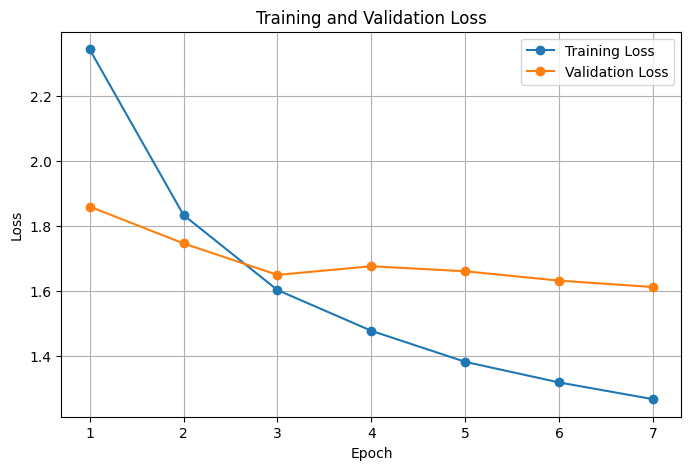

In [37]:
dl.train(7)

Epoch: 8
Training Loss: 1.2165377672513327
Validation Loss: 1.6434804734129171
Epoch: 9
Training Loss: 1.1803317546844483
Validation Loss: 1.6626253520640044
Epoch: 10
Training Loss: 1.1587754800584582
Validation Loss: 1.6451543867588043
Epoch: 11
Training Loss: 1.1568338362375896
Validation Loss: 1.6666611865735972
Epoch: 12
Training Loss: 1.1165298398335775
Validation Loss: 1.6628092773831809
Epoch: 13
Training Loss: 1.0926425308651395
Validation Loss: 1.6449260316216028
Epoch: 14
Training Loss: 1.0738583501180012
Validation Loss: 1.6537274318532302
Epoch: 15
Training Loss: 1.078512343565623
Validation Loss: 1.6742552160643613
Epoch: 16
Training Loss: 1.0607036142879063
Validation Loss: 1.6666949299665599
Epoch: 17
Training Loss: 1.045722623931037
Validation Loss: 1.6864874808547587


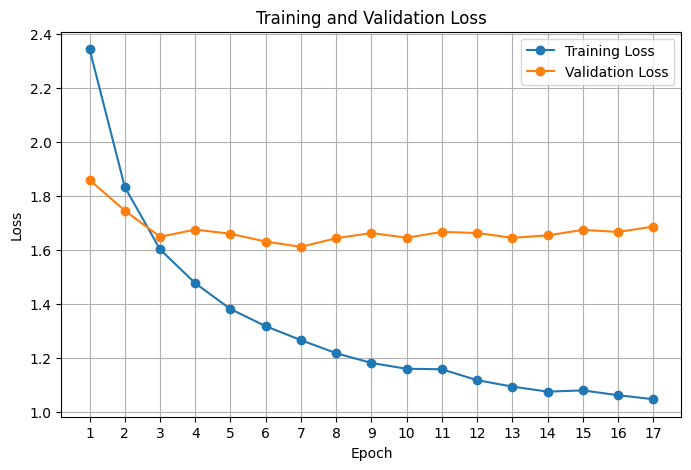

In [38]:
dl.train(10)

In [41]:
def evaluate_on_unseen_image(image_path,dl,confidence_threshold = 0.75, nms_threshold=0.1):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img_resized1 = cv2.resize(img,(224,224))
    img_resized = preprocess_image(img_resized1/255.)
    img_resized = img_resized.unsqueeze(0)
    #img = cv2.imread(image_path,1)[...,::-1]
    H = 224 
    W = 224
    candidates = get_candidates(img_resized1)
    all_candidates_with_index = []
    all_candidates = []
    for i in range(0,len(candidates)):
        x,y,w,h = candidates[i]
        x1,y1,x2,y2 = x,y,x+w,y+h
        all_candidates_with_index.append([0.0,x1,y1,x2,y2])
        all_candidates.append([x1,y1,x2,y2])
    #print(img_resized.shape)
    all_candidates = np.array(all_candidates,dtype=np.float32)
    all_candidates_with_index = np.array(all_candidates_with_index,dtype=np.float32)
    all_candidates_torch = torch.tensor(all_candidates_with_index)
    #print(all_candidates_torch.shape)
    img_resized = img_resized.to(device)
    all_candidates_torch = all_candidates_torch.to(device)
    dl.pick_the_best_model()
    dl.model.eval()
    with torch.no_grad():
        cls_logits, pred_deltas = dl.model(img_resized,all_candidates_torch)
    probabilities = F.softmax(cls_logits,dim=1)

    confidence, predicted_classes = torch.max(probabilities,dim=1)

    confidence = confidence.cpu().numpy()
    predicted_classes = predicted_classes.cpu().numpy()
    pred_deltas = pred_deltas.cpu().numpy()


    scale = np.array([W,H,W,H],dtype=np.float32)

    scaled_delta = pred_deltas * scale 
    predicted_boxes = all_candidates + scaled_delta 

    predicted_boxes[:, 0] = np.clip(predicted_boxes[:, 0], 0, W - 1)
    predicted_boxes[:, 1] = np.clip(predicted_boxes[:, 1], 0, H - 1)
    predicted_boxes[:, 2] = np.clip(predicted_boxes[:, 2], 0, W - 1)
    predicted_boxes[:, 3] = np.clip(predicted_boxes[:, 3], 0, H - 1)


    keep = predicted_classes != label2target["background"]

    confidence = confidence[keep]
    predicted_classes = predicted_classes[keep]
    predicted_boxes = predicted_boxes[keep]

    if len(predicted_boxes) == 0:
        print("No object detected")
        return

    keep = confidence >= confidence_threshold

    confidence = confidence[keep]
    predicted_classes = predicted_classes[keep]
    predicted_boxes = predicted_boxes[keep]

    if len(predicted_boxes)==0:
        print("No object detected")
        return

    nms_boxes = []
    for i in range(0,len(predicted_boxes)):
        x,y,X,Y = predicted_boxes[i]
        nms_boxes.append([float(x),float(y),float(X),float(Y)])
    nms_score = torch.tensor(confidence)
    nms_boxes = torch.tensor(nms_boxes)



    
    nms_indices = torchvision.ops.nms(nms_boxes,nms_score,nms_threshold)
    
    nms_indices = nms_indices.numpy()

    predicted_classes = predicted_classes[nms_indices]
    predicted_boxes = predicted_boxes[nms_indices]
    confidence = confidence[nms_indices]

    if len(predicted_boxes) == 0:
        print("NO OBJECT DETECTED")
        return


    display_img = img_resized1.copy()

    display_img_pil = Image.fromarray(display_img)

    draw = ImageDraw.Draw(display_img_pil)
    font = ImageFont.load_default()
    
    for box,score,cls in zip(predicted_boxes,confidence,predicted_classes):
        x1,y1,x2,y2 = box.astype(int)
        class_label = target2label[int(cls)]

        draw.rectangle(
        (x1, y1, x2, y2),
        outline=(0, 255, 0),
        width=2
        )

        scr = round(score,3)
        text = class_label +" : " + str(scr)

        text_x = x1
        text_y = max(y1 - 18, 0)

        draw.text(
        (text_x, text_y),
        text,
        font=font,
        fill=(0, 0, 255)
        )

    display_img = np.array(display_img_pil)
    plt.figure(figsize=(12, 8))
    plt.imshow(display_img)
    plt.axis("off")
    plt.show()

Image: 1


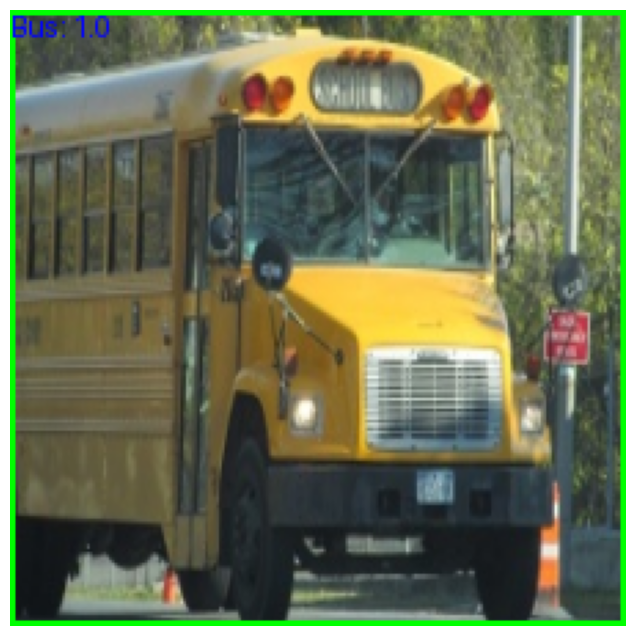

Image: 2
No object detected
Image: 3


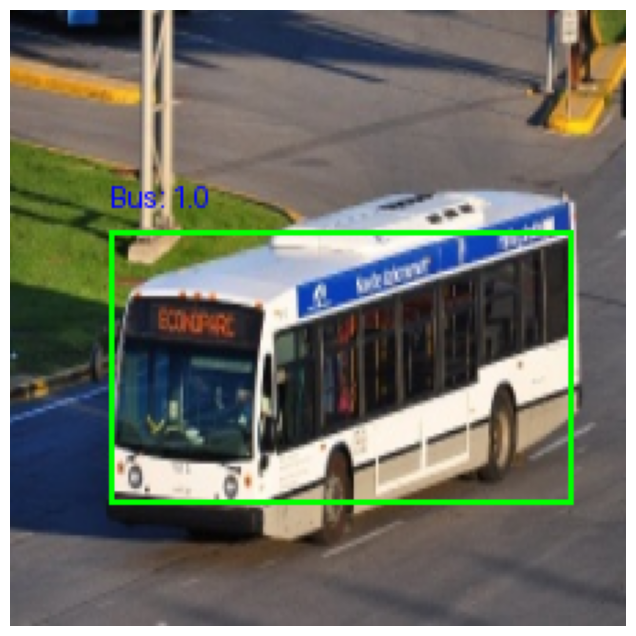

Image: 4


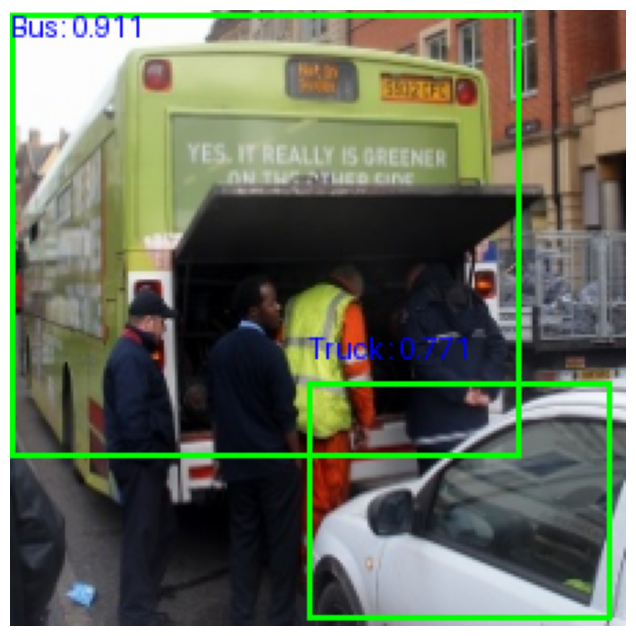

Image: 5


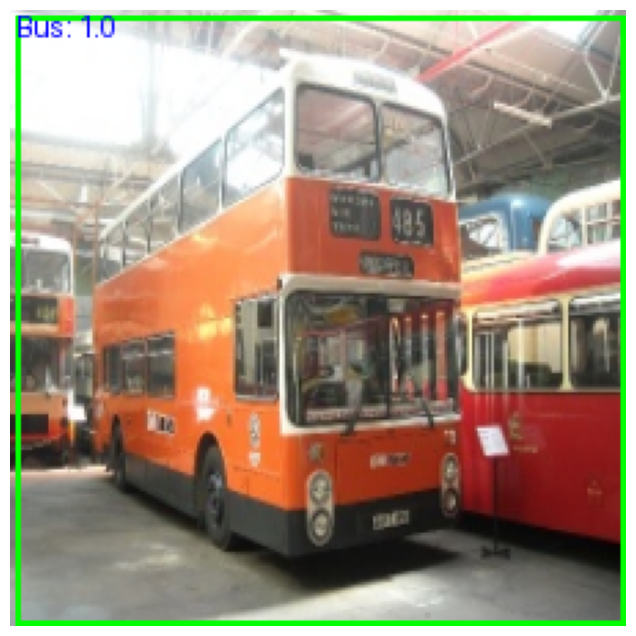

Image: 6


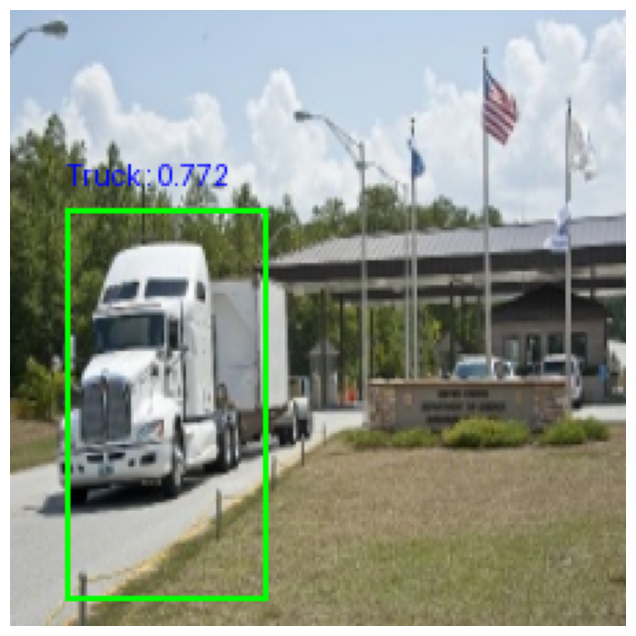

Image: 7
No object detected
Image: 8


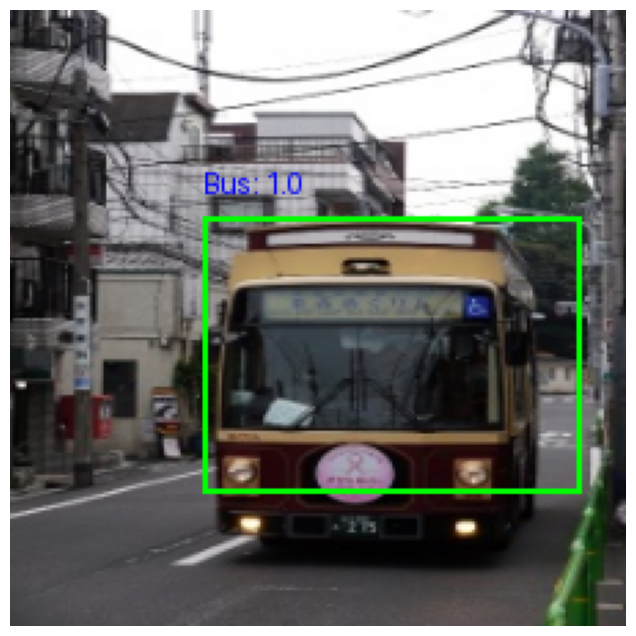

Image: 9


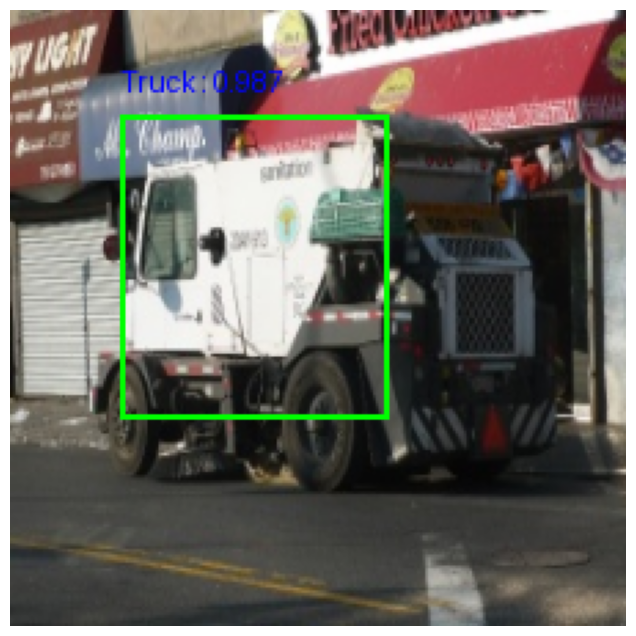

Image: 10


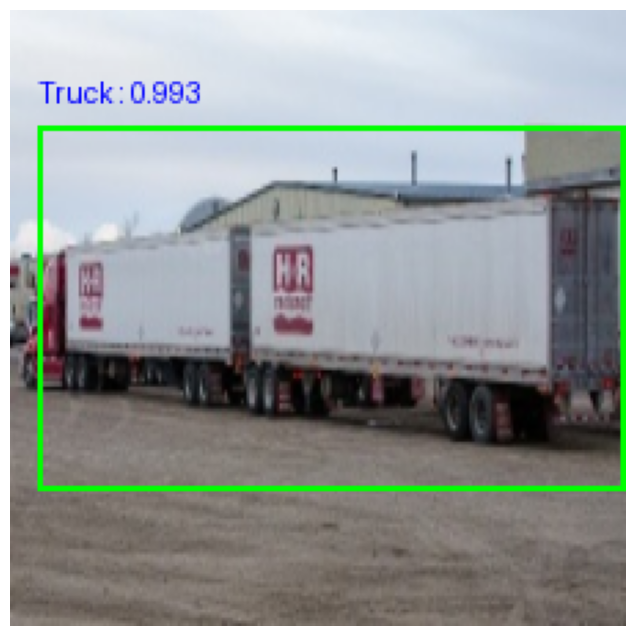

Image: 11


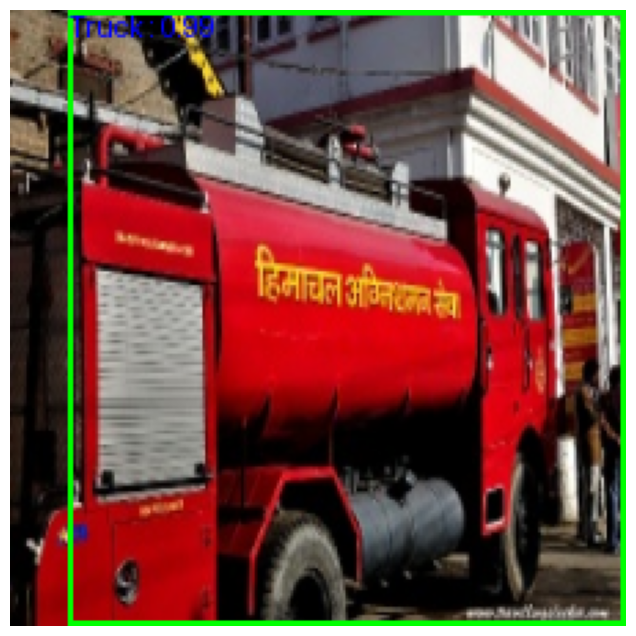

Image: 12


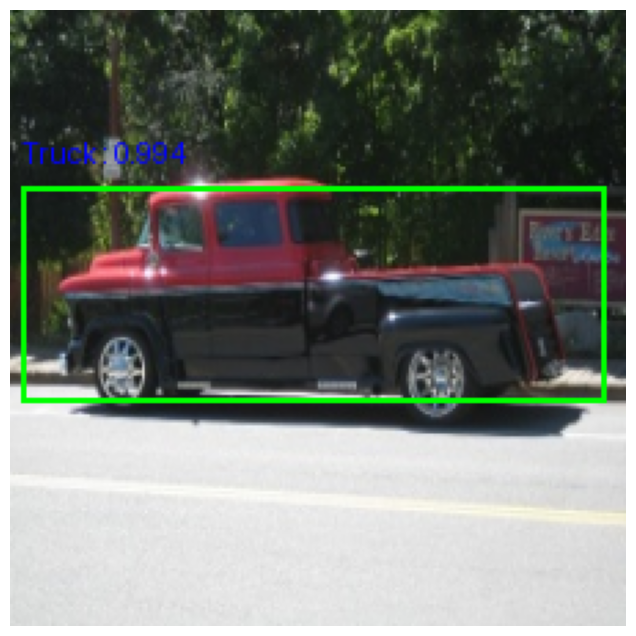

Image: 13


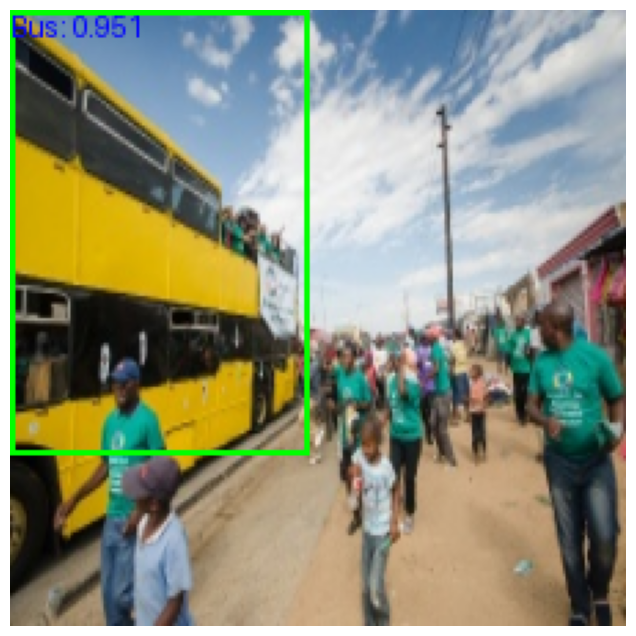

Image: 14


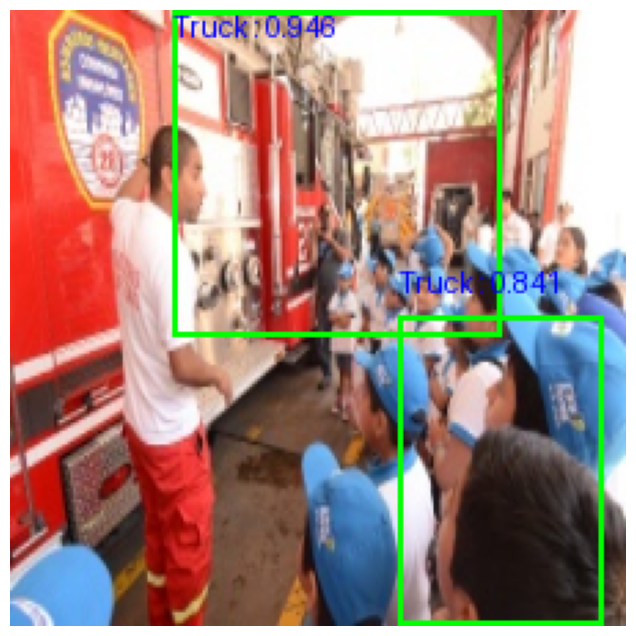

Image: 15


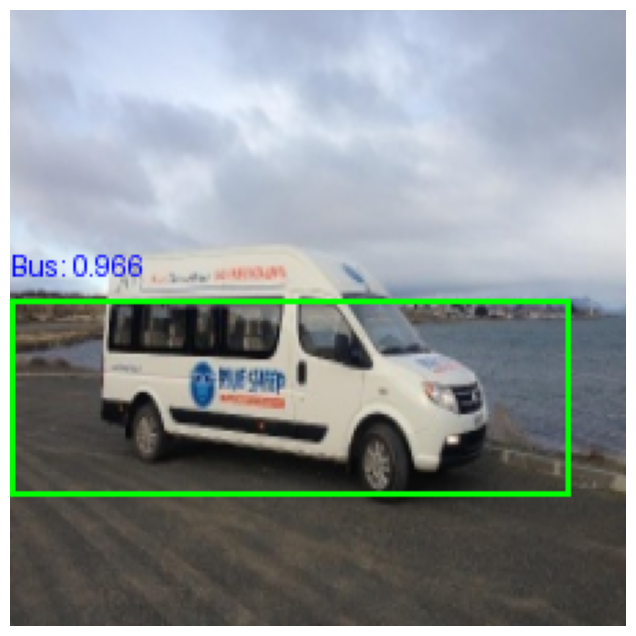

Image: 16


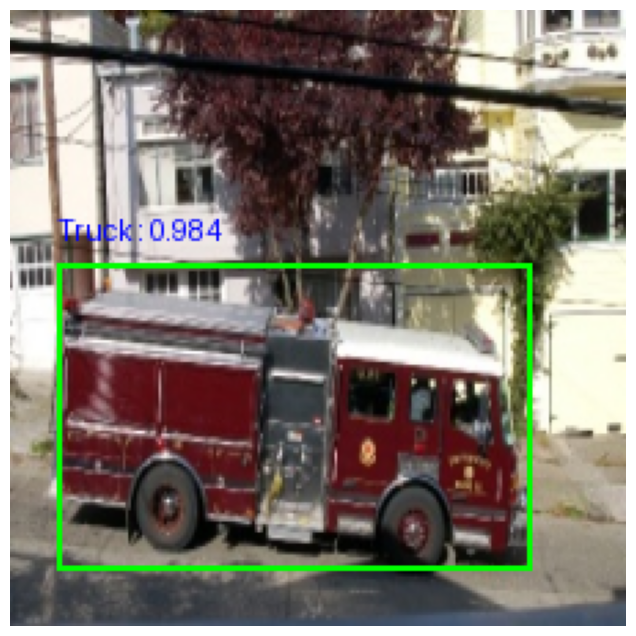

Image: 17


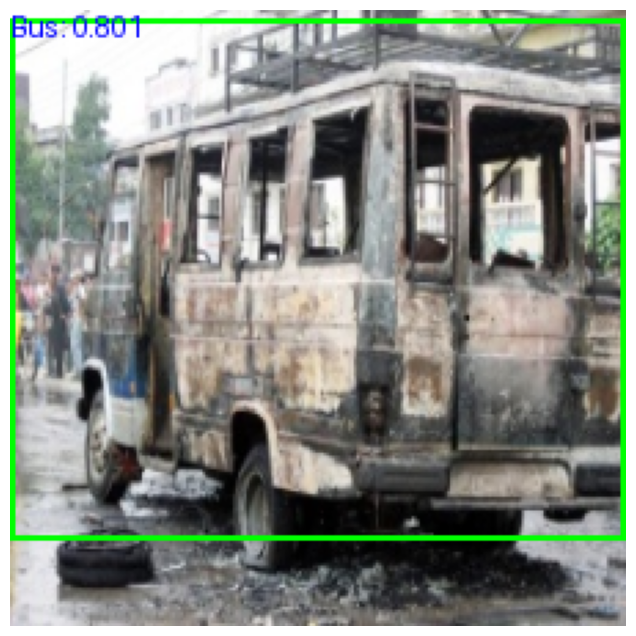

Image: 18


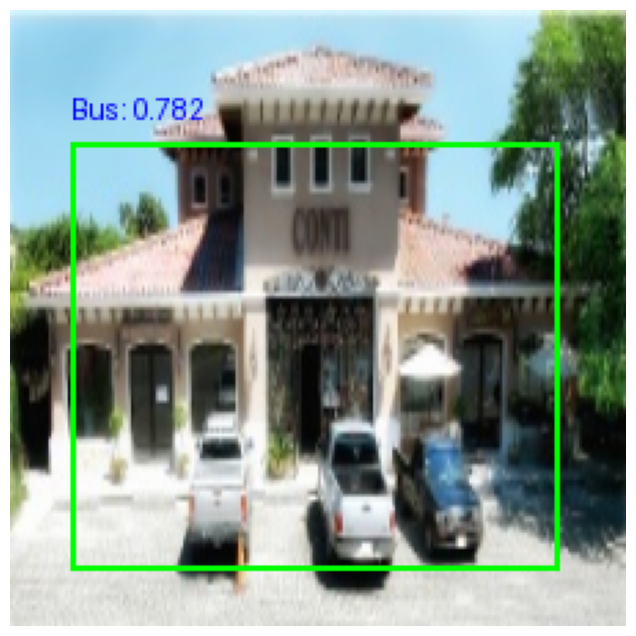

Image: 19


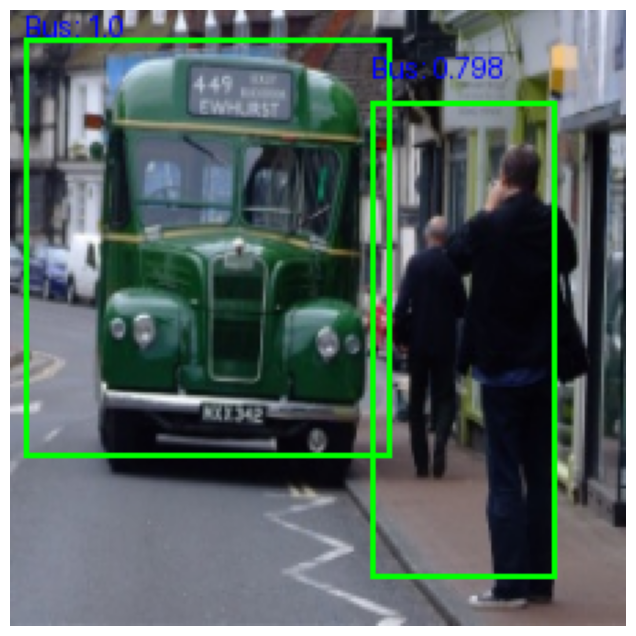

Image: 20
No object detected
Image: 21


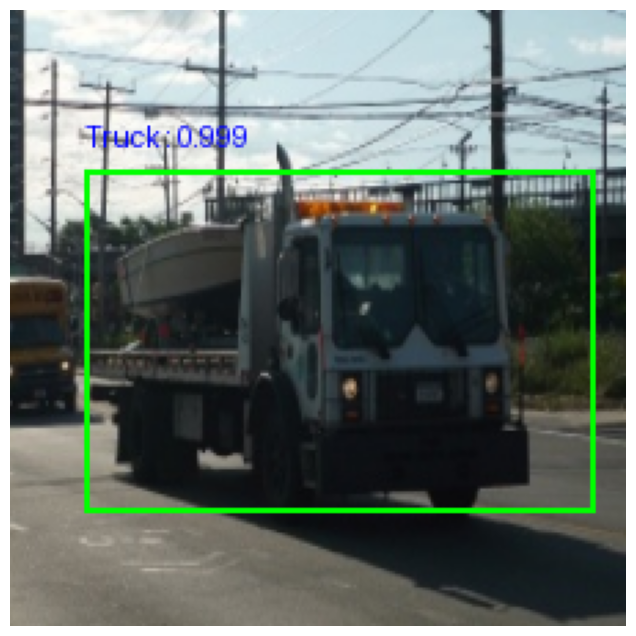

Image: 22
No object detected
Image: 23


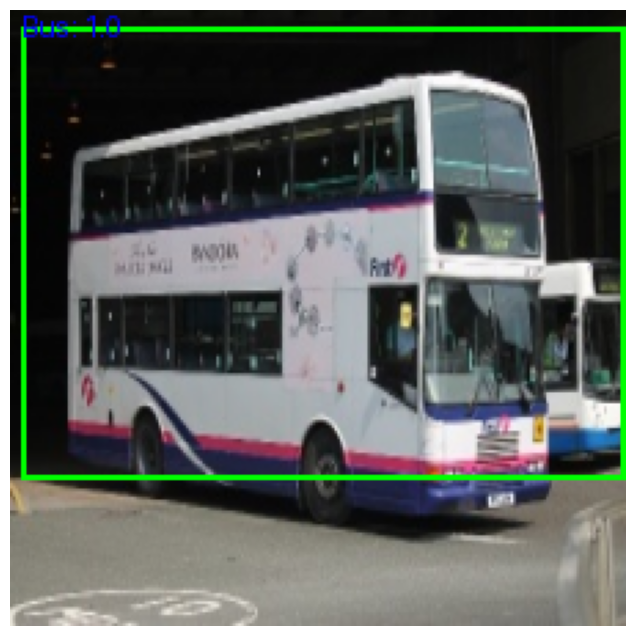

Image: 24


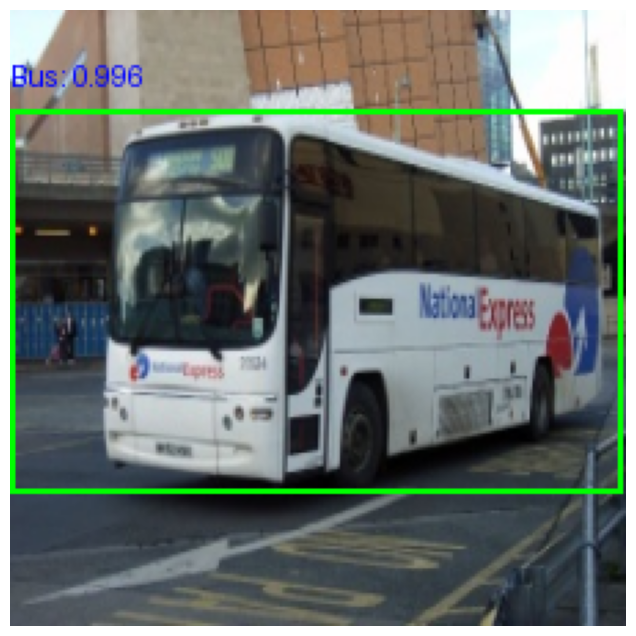

Image: 25


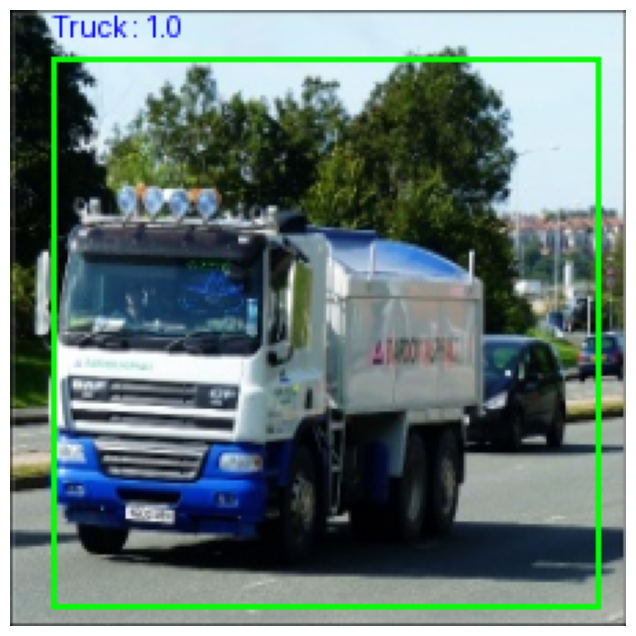

In [42]:
for i in range(0,len(test_set)):
    print("Image:",i+1)
    evaluate_on_unseen_image(test_set[i][3],dl)